In [1]:
import pandas as pd
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

In [2]:
data = pd.read_csv('../w_obj_detection_tracking/walmart_labels.csv')
data.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,frame_00808.png,1920,2560,cart,0,1346,861,2503
1,frame_00808.png,1920,2560,head,455,865,797,1236
2,frame_00808.png,1920,2560,person,304,861,1172,2378
3,frame_00785.png,1920,2560,cart,0,1331,865,2503
4,frame_00785.png,1920,2560,head,440,865,763,1236


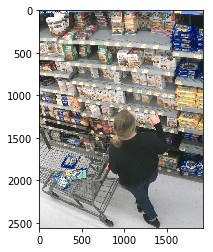

Image shape-> (2560, 1920, 3)


In [3]:
## Perform some sanity check on bounding boxes to make sure they are right
%matplotlib inline
img = cv2.cvtColor(cv2.imread('../../vid.alegion.com/data/src/20181021/181016_55.254.1.19_4184test_12/frames/frame_00211.png'),cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
print("Image shape-> {}".format(img.shape))



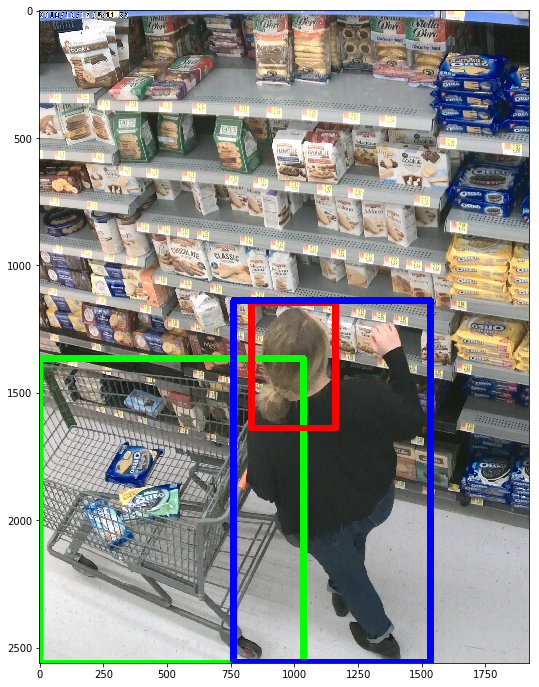

In [4]:
cv2.rectangle(img, (0,1365), (1036, 2560), (0,255,0), 25)
cv2.rectangle(img, (831,1145), (1161, 1638), (255,0,0), 25)
cv2.rectangle(img, (763,1138), (1533, 2556), (0,0,255), 25)
plt.figure(figsize=(15,12))
plt.imshow(img)
plt.show()

In [50]:
def draw_boxes(image_name):
    selected_value = data[data.filename == image_name]
    print(selected_value)
    img = cv2.cvtColor(cv2.imread('../../vid.alegion.com/data/src/20181021/181016_55.254.1.19_4184test_12/frames/{}'.format(image_name)),cv2.COLOR_BGR2RGB)
    color = [(0,255,0),(255,0,0),(0,0,255)]
    color_idx = 0
    for index, row in selected_value.iterrows():
        img = cv2.rectangle(img, (row['xmin'], row['ymin']), (row['xmax'], row['ymax']), color[color_idx],25)
        color_idx+=1
    return img

In [51]:
from PIL import Image

           filename  width  height   class  xmin  ymin  xmax  ymax
18  frame_00664.png   1920    2560    cart     4  1339   839  2507
19  frame_00664.png   1920    2560    head   360  1100   653  1585
20  frame_00664.png   1920    2560  person   357  1100  1051  2401


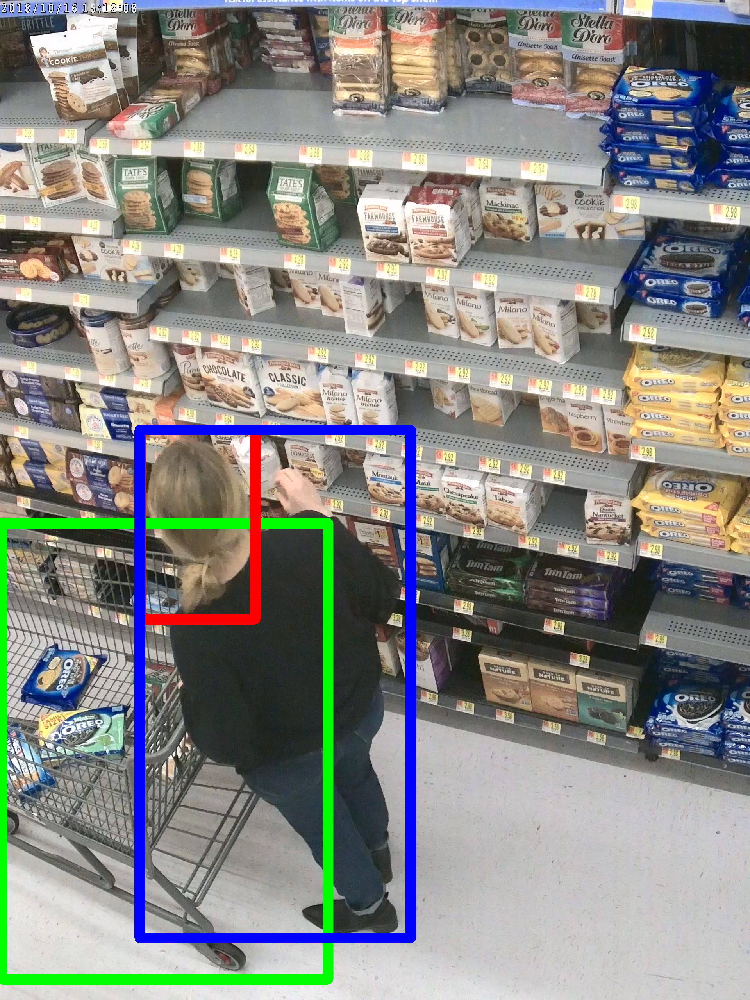

In [52]:
Image.fromarray(draw_boxes('frame_00664.png'))

Empty DataFrame
Columns: [filename, width, height, class, xmin, ymin, xmax, ymax]
Index: []


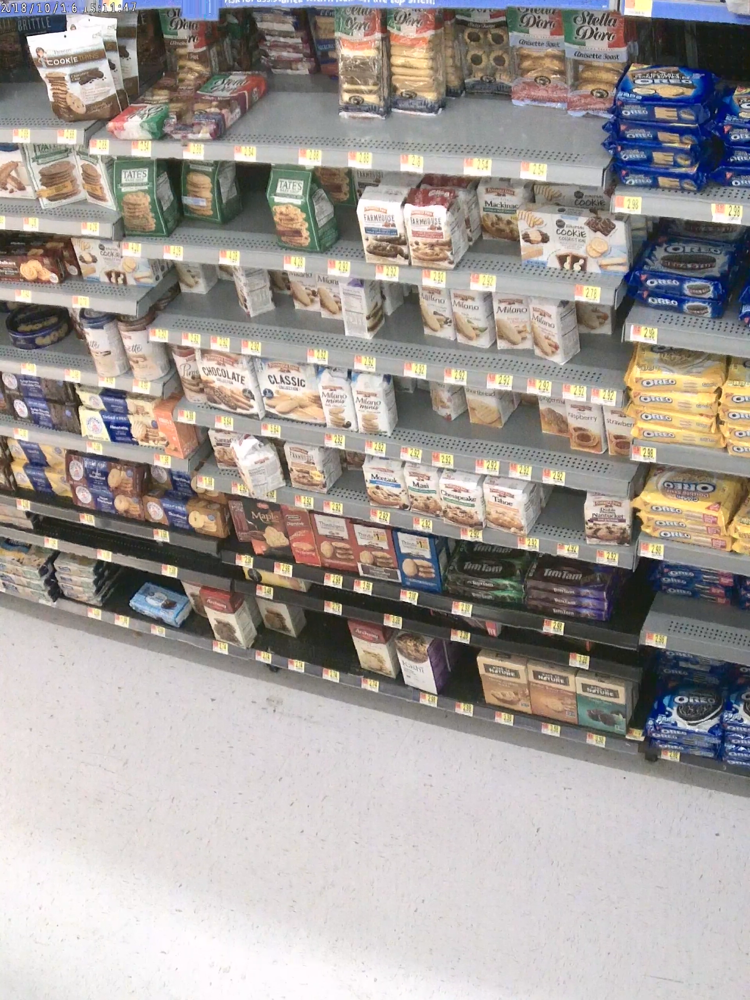

In [53]:
Image.fromarray(draw_boxes('frame_00025.png'))